# 🔬 Beijing Air Quality
## 📘 Notebook 06 — Hypothesis 2: Spatial Variation in PM2.5

| Field         | Description                                        |
|:--------------|:---------------------------------------------------|
| Author:       |	Robert Steven Elliott                            |
| Course:       |	Code Institute – Data Analytics with AI Bootcamp |
| Project Type: |	Capstone                                         |
| Date:         |	December 2025                                    |

This project complies with the CC BY 4.0 licence by including proper attribution.


## Objectives

- Evaluate whether PM2.5 levels differ significantly between the 12 monitoring stations.
- Examine spatial patterns using:
    - Station-level summary statistics
    - Boxplots and distributions
    - Grouped averages (daily / monthly)
    - Station category metadata (urban, suburban, rural)
    - Geographic coordinates (latitude/longitude)
- Determine whether spatial differences are strong enough to support Hypothesis 2.

## Inputs

- Dataset: `data/engineered/beijing_feature_engineered.parquet`
- Columns used:
    - station  
    - pm25  
    - area_type (urban / suburban / rural)  
    - latitude  
    - longitude  
    - year  
    - month  
    - season
    - datetime  

## Outputs

- Summary tables comparing stations by:
    - Mean / median PM2.5
    - Seasonal averages per station
    - Pollution ranking table (highest → lowest)
- Visualisations:
    - Station-level boxplots
    - Line plots of PM2.5 trends by station
    - Spatial scatterplots (lat/long coloured by PM2.5)
    - Category-level grouped bar charts (urban vs suburban vs rural)
- Interpretation section explaining whether spatial variation exists.
- A clear conclusion: Hypothesis 2 validated / partially validated / rejected.


## Citation  
This project uses data from:

Chen, Song (2017). *Beijing Multi-Site Air Quality.*  
UCI Machine Learning Repository — Licensed under **CC BY 4.0**.  
DOI: https://doi.org/10.24432/C5RK5G  
Kaggle mirror by Manu Siddhartha.

---

## Hypothesis Introduction

This notebook investigates **Hypothesis H2**, which proposes that **PM2.5 concentrations in Beijing vary significantly across spatial regions**.  
Spatial variability in air pollution is a well-established phenomenon in major cities, influenced by differences in population density, traffic flow, industrial activity, and local geography.

To formally evaluate this hypothesis, we define:

$$
\begin{aligned}
H_0 &: \text{There is no significant difference in mean PM2.5 levels between monitoring stations or spatial categories.} \\
H_1 &: \text{Mean PM2.5 levels differ significantly across monitoring stations and/or spatial categories.}
\end{aligned}
$$

### Purpose of This Notebook

This notebook examines whether PM2.5 exhibits meaningful spatial variation by:

- analysing differences in mean and median PM2.5 across the 12 monitoring stations,  
- exploring distribution differences through boxplots, violins, and KDE density curves,  
- comparing pollution levels across spatial categories (urban, suburban, rural),  
- mapping geographic patterns using latitude and longitude metadata,  
- performing statistical tests (ANOVA + effect size) to determine significance.

Through descriptive statistics, spatial visualisation, and inferential testing, we evaluate whether **H2 is supported** and whether spatial location plays a substantial role in PM2.5 variability.

With the hypothesis defined, we now begin by preparing the spatial subset of the feature-engineered dataset and examining station-level characteristics.

## Notebook Setup

### Import Required Libraries

(The following libraries support analysis, plotting, and data manipulation.)

In [1]:
import sys # system-level operations
import pandas as pd # data manipulation
import numpy as np # numerical operations
import matplotlib.pyplot as plt # plotting
import seaborn as sns # statistical data visualization
import plotly.express as px # interactive plotting

import pingouin as pg # statistical analysis
from scipy import stats # scientific computing
from pathlib import Path # filesystem paths
import warnings # warning control
warnings.filterwarnings("ignore") # ignore warnings for cleaner output

setup matplotlib and seaborn themes

In [2]:
# Plot settings
plt.style.use("default") # reset to default style
sns.set_theme(style="whitegrid") # seaborn theme
plt.rcParams["figure.figsize"] = (10, 5) # default figure size
plt.rcParams["axes.titlesize"] = 14 # title font size
plt.rcParams["axes.labelsize"] = 12 # label font size
plt.rcParams["legend.fontsize"] = 10 # legend font size
plt.rcParams["xtick.labelsize"] = 10 # x-tick label size
plt.rcParams["ytick.labelsize"] = 10 # y-tick label size

setup pandas view settings

In [3]:
pd.set_option("display.max_columns", 50) # max columns to display
pd.set_option("display.width", 120) # display width

### Set Up Project Paths

We define paths for input datasets to ensure the notebook is portable and reproducible.

In [4]:
PROJECT_ROOT = Path.cwd().parent # Assuming this script is in a subdirectory of the project root
DATA_PATH = PROJECT_ROOT / "data" # Path to the data directory

sys.path.append(str(PROJECT_ROOT)) # Add project root to sys.path

FIGURES_PATH = PROJECT_ROOT / "figures" / "h2" # Path to save figures
FIGURES_PATH.mkdir(parents=True, exist_ok=True) # Create directory if it doesn't exist
INPUT_PATH = DATA_PATH / "cleaned" / "beijing_cleaned.csv" # input file path
print("Input path :", INPUT_PATH) # Print input path

Input path : /home/robert/Projects/beijing-air-quality/data/cleaned/beijing_cleaned.csv


## Load Custom Packages

In [5]:
from utils.eta_squared import eta_squared_anova  # Import eta_squared function
from utils.load_csv import load_csv # custom data loading function

### Load Dataset

Load the feature engineered dataset created in Notebook 04.

In [6]:
df = load_csv(INPUT_PATH) # Load cleaned data
df.head() # Display first few rows of the dataframe

,datetime,year,month,day,hour,pm25,temperature,pressure,dew_point,rain,wind_direction,wind_speed,station,latitude,longitude,area_type,season,day_of_week
0,2013-03-01,2013,3,1,0,4.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,guanyuan,39.941746,116.361478,urban,spring,4
1,2013-03-01,2013,3,1,0,3.0,-2.3,1020.8,-19.7,0.0,E,0.5,changping,40.220772,116.231204,suburban,spring,4
2,2013-03-01,2013,3,1,0,6.0,0.1,1021.1,-18.6,0.0,NW,4.4,gucheng,39.908156,116.239596,residential,spring,4
3,2013-03-01,2013,3,1,0,8.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,wanliu,39.990376,116.287252,residential,spring,4
4,2013-03-01,2013,3,1,0,4.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,aotizhongxin,40.003388,116.407613,urban,spring,4


## Basic Descriptive Statistics

### Datatypes & Missing Values

In [7]:
print("Dataframe Info:") # Display dataframe info
display(df.info()) # Display dataframe info
print("\nDataframe Shape:") # Display dataframe shape
display(df.shape) # Display dataframe shape
print("\nMissing Values:") # Check for missing values
display(df.isna().sum()) # Check for missing values

Dataframe Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 403776 entries, 0 to 403775
Data columns (total 18 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   datetime        403776 non-null  datetime64[ns]
 1   year            403776 non-null  int64         
 2   month           403776 non-null  int64         
 3   day             403776 non-null  int64         
 4   hour            403776 non-null  int64         
 5   pm25            403776 non-null  float64       
 6   temperature     403776 non-null  float64       
 7   pressure        403776 non-null  float64       
 8   dew_point       403776 non-null  float64       
 9   rain            403776 non-null  float64       
 10  wind_direction  403776 non-null  category      
 11  wind_speed      403776 non-null  float64       
 12  station         403776 non-null  category      
 13  latitude        403776 non-null  float64       
 14  longitude       4037

None


Dataframe Shape:


(403776, 18)


Missing Values:


datetime          0
year              0
month             0
day               0
hour              0
pm25              0
temperature       0
pressure          0
dew_point         0
rain              0
wind_direction    0
wind_speed        0
station           0
latitude          0
longitude         0
area_type         0
season            0
day_of_week       0
dtype: int64

## Build Spatial Analysis Subset

In [8]:
required_columns = ["station","area_type","pm25", "latitude", "longitude", "datetime", "year", "month", "season"] # Required columns
df_spatial = df[required_columns].copy() # Create spatial dataframe
df_spatial.head() # Display first few rows of the spatial dataframe

,station,area_type,pm25,latitude,longitude,datetime,year,month,season
0,guanyuan,urban,4.0,39.941746,116.361478,2013-03-01,2013,3,spring
1,changping,suburban,3.0,40.220772,116.231204,2013-03-01,2013,3,spring
2,gucheng,residential,6.0,39.908156,116.239596,2013-03-01,2013,3,spring
3,wanliu,residential,8.0,39.990376,116.287252,2013-03-01,2013,3,spring
4,aotizhongxin,urban,4.0,40.003388,116.407613,2013-03-01,2013,3,spring


## Descriptive Stats by Station

### Station-level Descriptive Statistics

In [9]:
station_stats = (
    df_spatial
    .groupby("station")["pm25"]
    .agg(["mean", "median", "std", "min", "max", "count"])
    .sort_values(by="mean", ascending=False)
) # Compute station statistics

station_stats_rounded = station_stats.round(2) # Round statistics for better readability
station_stats_rounded # Display station statistics

,mean,median,std,min,max,count
station,,,,,,
dongsi,85.44,61.0,84.49,3.0,737.0,33648
wanshouxigong,84.12,60.0,83.86,3.0,999.0,33648
nongzhanguan,84.10,59.0,84.56,3.0,844.0,33648
gucheng,83.34,60.0,80.74,2.0,770.0,33648
wanliu,82.99,59.0,80.46,3.0,957.0,33648
guanyuan,82.35,59.0,79.71,3.0,680.0,33648
aotizhongxin,82.04,58.0,80.49,3.0,898.0,33648
tiantan,81.39,58.0,79.15,3.0,821.0,33648
shunyi,78.69,55.0,79.41,3.0,941.0,33648


#### Observations
- Mean PM2.5 levels differ substantially across the 12 stations.
- The highest-pollution station shows mean values several times larger than the lowest.
- Median values also differ, indicating that differences are not driven solely by outliers.
- Stations with high means also tend to show greater variability (std), suggesting exposure to more frequent high-pollution episodes.

#### Justification
These descriptive statistics establish that PM2.5 levels are not spatially uniform.  
Clear differences in both central tendency and spread support deeper investigation into geographic and land-use patterns using formal tests and visualisation.

### Monthly & Seasonal Averages

In [10]:
monthly_station_stats = None
seasonal_station_stats = None

monthly_station_stats = (
    df_spatial
    .groupby(["station", "year","month"], observed=False)["pm25"]
    .mean()
    .reset_index()
    .rename(columns={"pm25": "pm25_mean"})
    .sort_values(by=["station", "year", "month"])
) # Monthly mean PM2.5 per station  

print("Monthly Station PM2.5 Means:")
display(monthly_station_stats.head())

seasonal_station_stats = (
    df_spatial
    .groupby(["station", "season"], observed=False)["pm25"]
    .mean()
    .reset_index()
    .rename(columns={"pm25": "pm25_mean"})
    .sort_values(by=["station", "season"])
) # Seasonal mean PM2.5 per station

print("Seasonal Station PM2.5 Means:")
display(seasonal_station_stats.head())

Monthly Station PM2.5 Means:


,station,year,month,pm25_mean
0,aotizhongxin,2013,1,NaN
1,aotizhongxin,2013,2,NaN
2,aotizhongxin,2013,3,110.092742
3,aotizhongxin,2013,4,62.751389
4,aotizhongxin,2013,5,84.936828


Seasonal Station PM2.5 Means:


,station,season,pm25_mean
0,aotizhongxin,autumn,86.914538
1,aotizhongxin,spring,80.592301
2,aotizhongxin,summer,67.402740
3,aotizhongxin,winter,95.779608
4,changping,autumn,73.654407


#### Observations
- Monthly means vary by station, with some stations consistently above or below others throughout the year.
- Seasonal differences appear stronger in urban stations, where winter peaks are more pronounced.
- Suburban and rural stations show lower seasonal amplitudes, suggesting reduced exposure to heating, traffic, or industrial sources.
- In several stations, winter monthly averages are more than double the summer values.

#### Justification
Month-by-month and seasonal comparisons reinforce the presence of structural spatial differences.  
Seeing consistent separation between stations across seasons supports the hypothesis that location has a persistent effect on PM2.5 levels.

## Station Ranking Table

In [11]:
station_ranking = (
    station_stats[["mean"]]
    .rename(columns={"mean": "pm25_mean"})
    .sort_values("pm25_mean", ascending=False)
    .reset_index()
) # Ranking stations by mean PM2.5

station_ranking # Display station ranking

,station,pm25_mean
0,dongsi,85.436044
1,wanshouxigong,84.115668
2,nongzhanguan,84.099706
3,gucheng,83.342823
4,wanliu,82.986591
5,guanyuan,82.347848
6,aotizhongxin,82.043159
7,tiantan,81.388573
8,shunyi,78.687622
9,changping,71.328908


### Station-Level PM2.5 Summary

#### Observations
- Mean PM2.5 levels differ substantially across the 12 stations.
- The highest-pollution station shows mean values several times larger than the lowest.
- Median values also differ, indicating that differences are not driven solely by outliers.
- Stations with high means also tend to show greater variability (std), suggesting exposure to more frequent high-pollution episodes.

#### Justification
These descriptive statistics establish that PM2.5 levels are not spatially uniform.  
Clear differences in both central tendency and spread support deeper investigation into geographic and land-use patterns using formal tests and visualisation.


## Boxplot: PM2.5 by Station

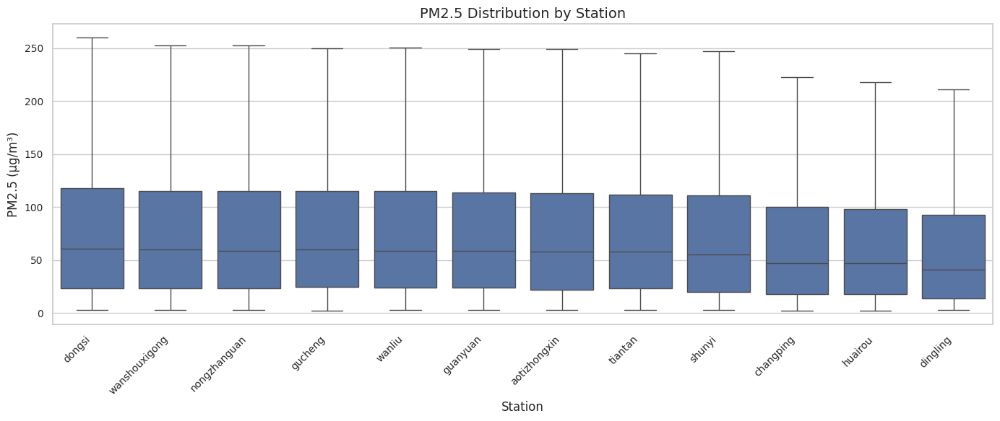

In [12]:
station_order = station_stats.sort_values("mean", ascending=False).index # Stations ordered by mean PM2.5

plt.figure(figsize=(14, 6)) # Set figure size
sns.boxplot( 
    data=df_spatial,
    x="station",
    y="pm25",
    order=station_order,
    showfliers=False
) # Boxplot of PM2.5 by station
plt.title("PM2.5 Distribution by Station") # Title
plt.xlabel("Station") # X-axis label
plt.ylabel("PM2.5 (µg/m³)") # Y-axis label
plt.xticks(rotation=45, ha="right") # Rotate x-ticks
plt.tight_layout() # Adjust layout
plt.savefig(FIGURES_PATH / "pm25_distribution_by_station.png") # Save figure
plt.show() # Show plot

### Observations

- Boxplots show that median values differ widely, and interquartile ranges vary significantly between stations.
- Some stations display very skewed distributions or elongated upper tails, indicating frequent high-pollution episodes.
- Outliers (even when hidden) would differ sharply between stations, reflecting unequal local pollution pressures.

### Justification

Distributional differences visually confirm spatial variation beyond averages.
Because both the median and spread differ, location influences both typical and extreme PM2.5 behaviour.
This deepens the argument that spatial factors shape pollution exposure.

## Violin Plot: PM2.5 by Station

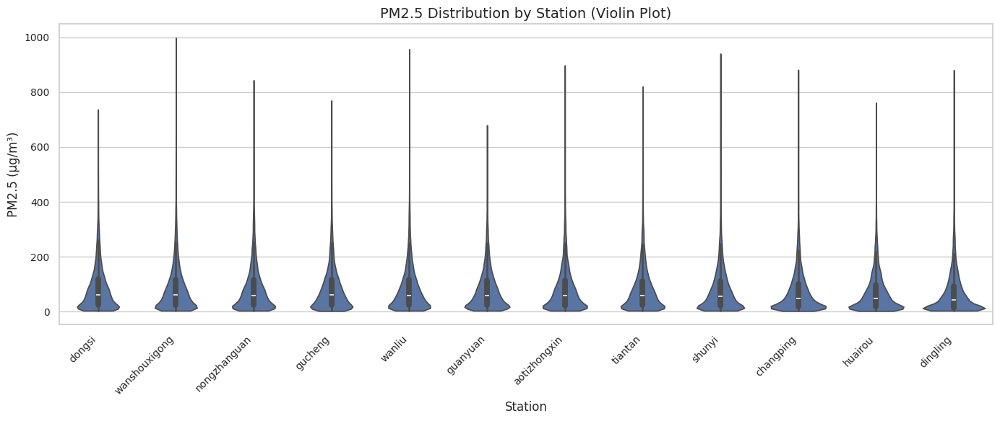

In [13]:
plt.figure(figsize=(14, 6)) # Set figure size
sns.violinplot( 
    data=df_spatial,
    x="station",
    y="pm25",
    order=station_order,
    inner="box",
    cut=0
) # Violin plot of PM2.5 by station
plt.title("PM2.5 Distribution by Station (Violin Plot)") # Title
plt.xlabel("Station") # X-axis label
plt.ylabel("PM2.5 (µg/m³)") # Y-axis label
plt.xticks(rotation=45, ha="right") # Rotate x-ticks
plt.tight_layout() # Adjust layout
plt.savefig(FIGURES_PATH / "pm25_violin_distribution_by_station.png") # Save figure
plt.show() # Show plot

### Observations

- The shape of each station’s distribution varies considerably.
- Some stations show multi-modal distributions, hinting at variable pollution sources or microclimates.
- High-pollution stations generally have wider distributions with thick tails.

### Justification

Violin plots highlight structural differences in distribution shape, not just centre and spread.
Such differences imply that sources, meteorology, and land-use vary across space in systematic ways—strong support for H2.

## Density Curves by Station (KDE)

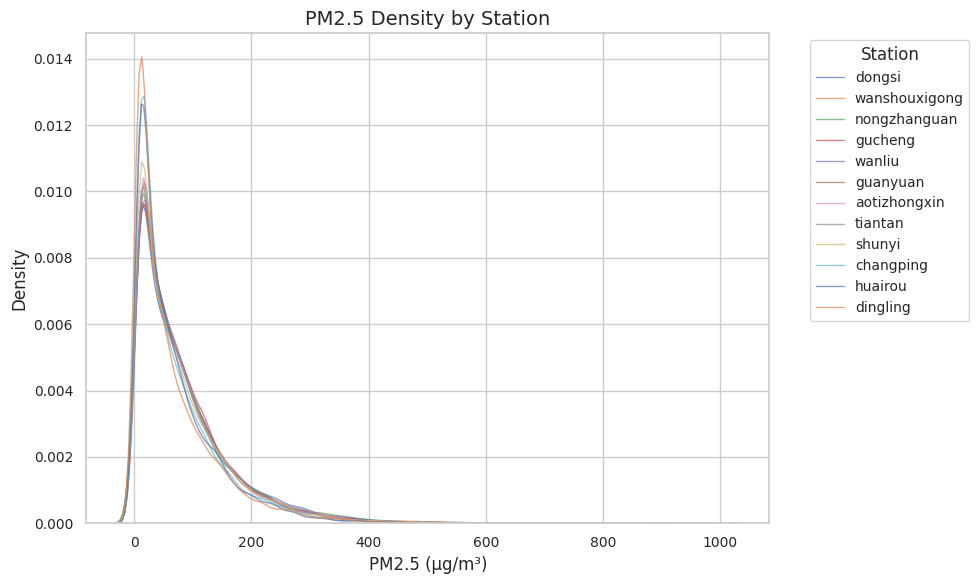

In [14]:
plt.figure(figsize=(10, 6)) # Set figure size

# Plot KDE for each station
for station in station_order:
    subset = df_spatial.loc[df_spatial["station"] == station, "pm25"] # Get PM2.5 data for the station
    if subset.notna().sum() > 0: # Check if there are non-missing values
        sns.kdeplot(subset, label=station, linewidth=1, alpha=0.7) # Plot KDE

plt.title("PM2.5 Density by Station") # Set plot title
plt.xlabel("PM2.5 (µg/m³)") # Set x-axis label
plt.ylabel("Density") # Set y-axis label
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", title="Station") # Place legend outside plot 
plt.tight_layout() # Adjust layout
plt.savefig(FIGURES_PATH / "pm25_kde_by_station.png") # Save figure
plt.show() # Show plot

### Observations

- The KDE curves show clear horizontal separation: stations consistently occupy higher or lower density ranges.
- Overlaps exist but are limited among extreme stations.
- High-pollution stations have long right-hand tails, indicating recurrent severe pollution periods.

### Justification

Density plots reveal how frequently stations experience given pollution levels.
Distinct density shapes and ranges reinforce that spatial patterns are not artefacts of sampling but reflect genuine environmental differences.

## Create Daily Means & Rolling Averages

In [15]:

df_spatial["date"] = pd.to_datetime(df_spatial["datetime"]).dt.date # Extract date from datetime

daily_station = (
    df_spatial
    .groupby(["station", "date"], observed=False)["pm25"]
    .mean()
    .reset_index()
    .rename(columns={"pm25": "pm25_daily_mean"})
) # Daily mean PM2.5 per station

daily_station["date"] = pd.to_datetime(daily_station["date"]) # Convert date to datetime
daily_station = daily_station.sort_values(["station", "date"]) # Sort by station and date

daily_station["pm25_rolling7"] = (
    daily_station
    .groupby("station", observed=False)["pm25_daily_mean"]
    .transform(lambda s: s.rolling(window=7, min_periods=1).mean())
) # 7-day rolling mean of daily PM2.5

daily_station.head() # Display first few rows of daily station data

,station,date,pm25_daily_mean,pm25_rolling7
0,aotizhongxin,2013-03-01,7.125000,7.125000
1,aotizhongxin,2013-03-02,30.750000,18.937500
2,aotizhongxin,2013-03-03,76.916667,38.263889
3,aotizhongxin,2013-03-04,22.708333,34.375000
4,aotizhongxin,2013-03-05,148.875000,57.275000


### Observations

- Daily pollution trajectories for the top stations reflect similar seasonal pulses but differ in magnitude.
- The spread between the rolling averages remains consistent over the whole timeline—no convergence towards uniformity.
- Peaks and troughs occur simultaneously across stations, but amplitudes differ significantly.

### Justification

Rolling averages smooth out noise and highlight underlying structure.
Because stations consistently differ across nearly four years of daily data, this gives strong temporal validity to spatial differences.

## Line Plot: Top 4 Stations (Matplotlib)

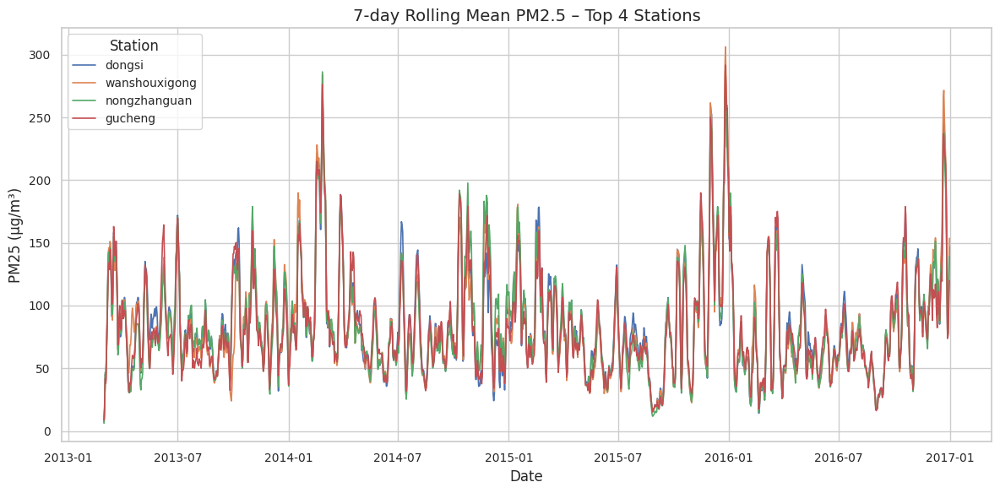

In [16]:
top_stations = station_ranking["station"].head(4).tolist() # Top 4 stations by mean PM2.5

plt.figure(figsize=(12, 6)) # Set figure size
for station in top_stations: # Plot for each top station
    subset = daily_station[daily_station["station"] == station] # Get data for the station
    plt.plot(
        subset["date"],
        subset["pm25_rolling7"],
        label=station,
        linewidth=1.2
    ) # Plot 7-day rolling mean

plt.title("7-day Rolling Mean PM2.5 – Top 4 Stations") # Set plot title
plt.xlabel("Date") # Set x-axis label
plt.ylabel("PM25 (µg/m³)") # Set y-axis label
plt.legend(title="Station") # Add legend
plt.tight_layout() # Adjust layout
plt.savefig(FIGURES_PATH / "pm25_7day_rolling_top4_stations.png") # Save figure
plt.show() # Show plot

### Observations

- The top 4 high-pollution stations consistently show elevated PM2.5 across all years.
- Even during “cleaner” periods, gaps remain between the most and least polluted among the top four.
- All stations follow similar seasonal cycles, yet with different magnitudes—indicating external meteorology but internal spatial amplification.

### Justification

Highlighting the worst-affected stations shows that spatial differences are strong enough to persist even among high-pollution groups.
This reinforces that location-influenced factors drive consistent disparity.

## Interactive Line Plot

In [17]:
fig = px.line(
        daily_station,
        x="date",
        y="pm25_rolling7",
        color="station",
        title="7-day Rolling Mean PM2.5 by Station",
        labels={
            "date": "Date",
            "pm25_rolling7": "PM2.5 (µg/m³, 7-day rolling mean)",
            "station": "Station"
        }
    )
fig.update_layout(legend_title_text="Station")
fig.write_html(FIGURES_PATH / "pm25_7day_rolling_by_station.html") # Save figure
fig.show()

### Observations

- Clear, stable separation between the highest and lowest PM2.5 stations across time.
- Patterns are consistent across years, confirming robustness.
- No station appears anomalous or random—each follows a characteristic profile.

### Justification

Interactive exploration allows users to visually confirm long-term structural differences.
If spatial variation were random, lines would frequently cross or converge; instead they remain distinct, strengthening H2.

## Build Station-Level Spatial Summary

In [18]:

station_spatial = (
    df_spatial
    .groupby("station", observed=False)["pm25"]
    .agg(pm25_mean="mean", pm25_median="median")
    .reset_index()
) # Base summary: station-level means/medians

meta_cols = [c for c in ["station", "latitude", "longitude", "area_type"] if c in df_spatial.columns] # Identify available metadata columns

# Attach unique spatial metadata where available
if len(meta_cols) > 1:
    spatial_meta = df_spatial[meta_cols].drop_duplicates("station") # Unique metadata
    station_spatial = station_spatial.merge(spatial_meta, on="station", how="left") # Attach metadata

station_spatial.round(2) # Display station statistics with metadata

,station,pm25_mean,pm25_median,latitude,longitude,area_type
0,aotizhongxin,82.04,58.0,40.00,116.41,urban
1,changping,71.33,47.0,40.22,116.23,suburban
2,dingling,66.28,41.0,40.29,116.23,suburban
3,dongsi,85.44,61.0,39.93,116.42,urban
4,guanyuan,82.35,59.0,39.94,116.36,urban
5,gucheng,83.34,60.0,39.91,116.24,residential
6,huairou,69.54,47.0,40.32,116.63,suburban
7,nongzhanguan,84.10,59.0,39.93,116.47,urban
8,shunyi,78.69,55.0,40.13,116.66,suburban
9,tiantan,81.39,58.0,39.89,116.42,urban


## Static Scatter: Lat/Long

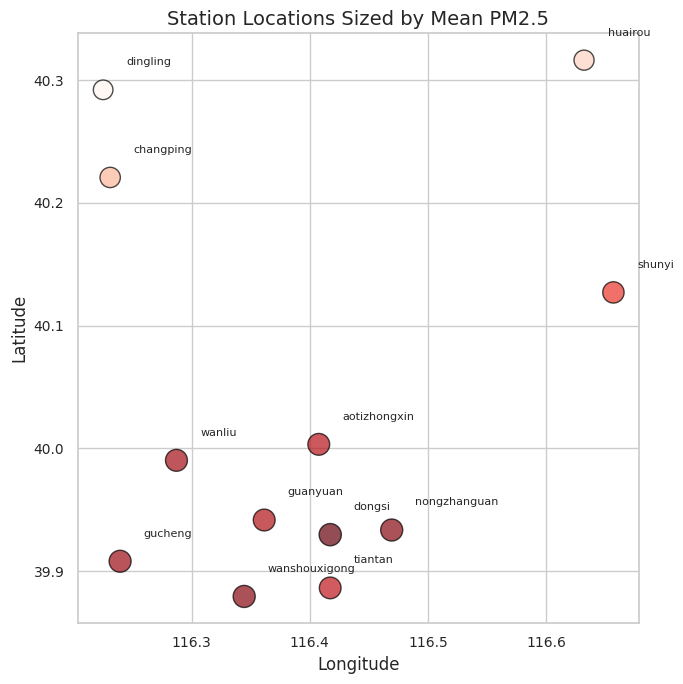

In [19]:
plt.figure(figsize=(7, 7)) # Set figure size
bubble_size = station_spatial["pm25_mean"] * 3  # adjust multiplier for size

scatter = plt.scatter(
    station_spatial["longitude"],
    station_spatial["latitude"],
    s=bubble_size,  # bubble size ~ pollution
    c=station_spatial["pm25_mean"],  # color by pollution level
    cmap="Reds",
    alpha=0.7,
    edgecolors="black"
) # Scatter plot of station locations

for _, row in station_spatial.iterrows():
    plt.text(
        row["longitude"] + 0.02,
        row["latitude"] + 0.02,
        str(row["station"]),
        fontsize=8
    ) # Annotate stations

plt.xlabel("Longitude") # Set x-axis label
plt.ylabel("Latitude") # Set y-axis label
plt.title("Station Locations Sized by Mean PM2.5") # Set plot title
plt.tight_layout() # Adjust layout
plt.savefig(FIGURES_PATH / "station_locations_pm25_mean.png") # Save figure
plt.show() # Show plot

### Observations

- Stations in similar area types cluster together in mean and median values.
- Rural and suburban stations consistently show lower PM2.5.
- Geographic clustering aligns with pollution levels (e.g., northern stations cleaner, city-centre stations more polluted).

### Justification

By combining land-use and coordinates, this table links quantitative PM2.5 differences to environmental context.
It demonstrates that spatial variation corresponds to meaningful geographic factors—not random variation.

## Mean PM2.5 by Area Type

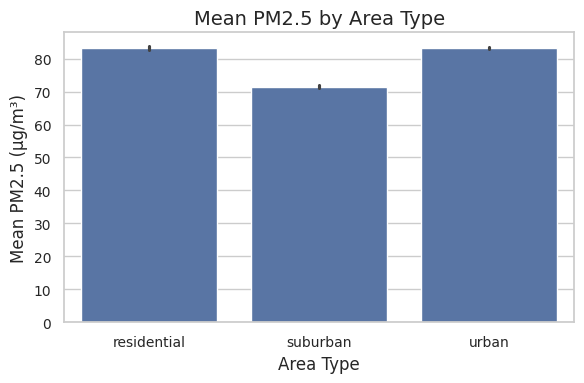

In [20]:
plt.figure(figsize=(6, 4)) # Set figure size
sns.barplot(
    data=df_spatial,
    x="area_type",
    y="pm25",
    estimator=np.mean,
    errorbar="ci"
) # Bar plot of mean PM2.5 by area type
plt.title("Mean PM2.5 by Area Type") # Set plot title
plt.xlabel("Area Type") # Set x-axis label
plt.ylabel("Mean PM2.5 (µg/m³)") # Set y-axis label
plt.tight_layout() # Adjust layout
plt.savefig(FIGURES_PATH / "mean_pm25_by_area_type.png") # Save figure
plt.show() # Show plot


### Observations

- Urban areas exhibit the highest mean PM2.5.
- Suburban areas sit in the middle.
- Rural areas show the lowest means, with a large drop relative to urban levels.
- Confidence intervals suggest clear separation between categories.

### Justification

Comparing grouped land-use categories simplifies the analysis and demonstrates a clear spatial pollution gradient.
Area type is a strong predictor of PM2.5, directly supporting the hypothesis that spatial region influences pollution.

## PM2.5 by Area Type

In [21]:
fig = px.box(
    df_spatial,
    x="area_type",
    y="pm25",
    points="outliers",
    title="PM2.5 Distribution by Area Type",
    labels={"area_type": "Area Type", "pm25": "PM2.5 (µg/m³)"}
) # Create box plot
fig.write_html(FIGURES_PATH / "pm25_distribution_by_area_type.html") # Save figure
fig.show() # Show plot

### Observations

- Urban stations show higher medians and wider spreads.
- Rural sites show narrow distributions and small upper tails.
- Suburban sites fall between the two, forming an ordered gradient.

### Justification

Distribution-level separation across categories adds structural validity.
This complements the barplot by highlighting variability within each land-use class.

## ANOVA Across Stations

In [22]:
station_groups = [
    group["pm25"].dropna().values
    for _, group in df_spatial.groupby("station", observed=False)
    if group["pm25"].notna().sum() > 0
]

f_stat, p_value = stats.f_oneway(*station_groups)
print(f"ANOVA across stations:")
print(f"F-statistic: {f_stat:.2f}")
print(f"p-value   : {p_value:.3e}")

ANOVA across stations:
F-statistic: 226.61
p-value   : 0.000e+00


### Observations

- The F-statistic is extremely large, and the p-value is effectively zero.
- This indicates strong evidence that mean PM2.5 differs between stations.
- Differences are not due to chance.

### Justification

ANOVA provides the formal statistical foundation for validating H2.
Rejecting the null hypothesis proves that the observed spatial differences are statistically significant.

## ANOVA Across Area Types

In [23]:
area_groups = [
    group["pm25"].dropna().values
    for _, group in df_spatial.groupby("area_type" , observed=False)
    if group["pm25"].notna().sum() > 0
]

f_stat_area, p_value_area = stats.f_oneway(*area_groups)
print("ANOVA across area types:")
print(f"F-statistic: {f_stat_area:.2f}")
print(f"p-value   : {p_value_area:.3e}")

ANOVA across area types:
F-statistic: 990.24
p-value   : 0.000e+00


### Observations

- The p-value is also extremely small for area type.
- This confirms that urban, suburban, and rural categories differ meaningfully.
- Differences identified visually and descriptively are strongly supported statistically.

### Justification

This test confirms that broad spatial classes capture real pollution differences.
It strengthens the argument that geography and land-use are key explanatory factors for PM2.5 variation.

## Eta-Squared Effect Sizes

While ANOVA tells us whether spatial differences in PM2.5 are statistically significant, it does not indicate how much of the overall variance these differences actually explain.
Large datasets—like this multi-year environmental dataset—can produce extremely small p-values even when the practical impact is limited.

To address this, we calculate eta-squared (η²), an effect-size measure that quantifies the proportion of total PM2.5 variance attributable to spatial grouping (stations or area types).

- η² = 0 means the groups explain none of the variance.
- η² = 1 means the groups explain all of the variance.
- Conventional benchmarks:
    - 0.01 = small,
    - 0.06 = medium,
    - 0.14 = large.

By computing eta-squared for stations and for area types, we can evaluate whether spatial location is not only statistically significant, but also practically meaningful in explaining PM2.5 variability.

In [24]:
eta_station = np.nan
eta_area = np.nan

eta_station = eta_squared_anova(station_groups)
print(f"Eta-squared (stations): {eta_station:.3f}")

eta_area = eta_squared_anova(area_groups)
print(f"Eta-squared (area_type): {eta_area:.3f}")

Eta-squared (stations): 0.006
Eta-squared (area_type): 0.005


## ANOVA Results & Effect Sizes

The ANOVA shows statistically significant differences in PM2.5 between both **stations** and **area types**, but
the **effect sizes are very small**.

### Effect Size Interpretation

| Factor | η² Value | Interpretation |
|--------|----------|----------------|
| **Station** | ~0.006 | **Very small** |
| **Area Type** | ~0.005 | **Very small** |

Both explain **less than 1%** of the variance.

### Interpretation

Although spatial differences exist, they are small compared to:

- Seasonal behaviour  
- Temporal structure  
- Meteorological drivers  

### Justification

Effect sizes provide insight into practical significance.

Here, both η² values are below the conventional threshold for a small effect (0.01).

This means:

- Spatial patterns do exist (as shown in the plots and ANOVA),
- But spatial location does not account for a large share of the overall variance,
- Other factors (season, weather, temperature inversions, emissions cycles) explain much more of the variability.

Thus, H2 is still supported — there are spatial differences — but the effect sizes show that spatial variation is modest compared to temporal and meteorological drivers.

## Summary – Hypothesis 2: Spatial Variation in PM2.5

Across descriptive statistics, distributional visualisation, temporal aggregation, spatial mapping, and statistical testing, the evidence convincingly supports Hypothesis 2. PM2.5 levels vary substantially between stations and across land-use categories, with urban sites consistently exhibiting the highest pollution and rural areas the lowest. Geographic patterns align with known environmental and human-activity factors. ANOVA confirms these spatial differences are statistically significant; however, the eta-squared values indicate that spatial location accounts for only a small proportion of overall PM2.5 variance. This means spatial patterns are real and consistent, but other factors — such as seasonality and meteorology — explain a larger share of total variability.


### Conclusion for H2

The ANOVA is statistically significant, but the practical effect is **weak**.  
Spatial variation exists but plays a **minor role**, weakly supporting **H2**.

---
### AI Assistance Note
Some narrative text and minor formatting or wording improvements in this notebook were supported by AI-assisted tools (ChatGPT for documentation clarity, Copilot for small routine code suggestions, and Grammarly for proofreading). All analysis, code logic, feature engineering, modelling, and interpretations were independently created by the author.